## Лабораторная работа 2

## 1. Предобработка данных
## Загрузка библиотек

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns                       #visualisation
import matplotlib.pyplot as plt             #visualisation
%matplotlib inline     

## Загрузка данных

In [2]:

df = pd.read_csv("genres_v2.csv",low_memory = False)
# To display the top 5 rows 
df.head(5)  

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,song_name,Unnamed: 0,title
0,0.831,0.814,2,-7.364,1,0.4200,0.0598,0.013400,0.0556,0.3890,...,2Vc6NJ9PW9gD9q343XFRKx,spotify:track:2Vc6NJ9PW9gD9q343XFRKx,https://api.spotify.com/v1/tracks/2Vc6NJ9PW9gD...,https://api.spotify.com/v1/audio-analysis/2Vc6...,124539,4,Dark Trap,Mercury: Retrograde,NaN,NaN
1,0.719,0.493,8,-7.230,1,0.0794,0.4010,0.000000,0.1180,0.1240,...,7pgJBLVz5VmnL7uGHmRj6p,spotify:track:7pgJBLVz5VmnL7uGHmRj6p,https://api.spotify.com/v1/tracks/7pgJBLVz5Vmn...,https://api.spotify.com/v1/audio-analysis/7pgJ...,224427,4,Dark Trap,Pathology,NaN,NaN
2,0.850,0.893,5,-4.783,1,0.0623,0.0138,0.000004,0.3720,0.0391,...,0vSWgAlfpye0WCGeNmuNhy,spotify:track:0vSWgAlfpye0WCGeNmuNhy,https://api.spotify.com/v1/tracks/0vSWgAlfpye0...,https://api.spotify.com/v1/audio-analysis/0vSW...,98821,4,Dark Trap,Symbiote,NaN,NaN
3,0.476,0.781,0,-4.710,1,0.1030,0.0237,0.000000,0.1140,0.1750,...,0VSXnJqQkwuH2ei1nOQ1nu,spotify:track:0VSXnJqQkwuH2ei1nOQ1nu,https://api.spotify.com/v1/tracks/0VSXnJqQkwuH...,https://api.spotify.com/v1/audio-analysis/0VSX...,123661,3,Dark Trap,ProductOfDrugs (Prod. The Virus and Antidote),NaN,NaN
4,0.798,0.624,2,-7.668,1,0.2930,0.2170,0.000000,0.1660,0.5910,...,4jCeguq9rMTlbMmPHuO7S3,spotify:track:4jCeguq9rMTlbMmPHuO7S3,https://api.spotify.com/v1/tracks/4jCeguq9rMTl...,https://api.spotify.com/v1/audio-analysis/4jCe...,123298,4,Dark Trap,Venom,NaN,NaN


## Удаление нерелевантных столбцов
Удаляем следующие столбцы: id, uri, track_href, analysis_url, Unnamed:0, title,type

In [3]:
df = df.drop(['id', 'uri', 'track_href', 'analysis_url', 'Unnamed: 0', 'title','type','song_name','time_signature'], axis=1)
df.head(5)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,genre
0,0.831,0.814,2,-7.364,1,0.4200,0.0598,0.013400,0.0556,0.3890,156.985,124539,Dark Trap
1,0.719,0.493,8,-7.230,1,0.0794,0.4010,0.000000,0.1180,0.1240,115.080,224427,Dark Trap
2,0.850,0.893,5,-4.783,1,0.0623,0.0138,0.000004,0.3720,0.0391,218.050,98821,Dark Trap
3,0.476,0.781,0,-4.710,1,0.1030,0.0237,0.000000,0.1140,0.1750,186.948,123661,Dark Trap
4,0.798,0.624,2,-7.668,1,0.2930,0.2170,0.000000,0.1660,0.5910,147.988,123298,Dark Trap


## Удаление дубликатов

In [4]:
df.shape

(42305, 13)

In [5]:
duplicate_rows_df = df[df.duplicated()]
print("number of duplicate rows: ", duplicate_rows_df.shape)

number of duplicate rows:  (4180, 13)


В базе данных 4140 строк-дубликатов, удалим их

In [6]:
df = df.drop_duplicates()
df.shape

(38125, 13)

Проверим наличие пропущенных значений

In [7]:
print(df.isnull().sum())

danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
genre               0
dtype: int64


Пропусков нет

## Нормализация

In [8]:
from sklearn.preprocessing import MinMaxScaler

mms = MinMaxScaler()
#print(df)

df["key"] = mms.fit_transform(df[["key"]])
df["loudness"] = mms.fit_transform(df[["loudness"]])
df["tempo"] = mms.fit_transform(df[["tempo"]])
df["duration_ms"] = mms.fit_transform(df[["duration_ms"]])

df.head(5)


,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,genre
0,0.831,0.814,0.181818,0.712039,1,0.4200,0.0598,0.013400,0.0556,0.3890,0.610006,0.111487,Dark Trap
1,0.719,0.493,0.727273,0.715710,1,0.0794,0.4010,0.000000,0.1180,0.1240,0.351848,0.224043,Dark Trap
2,0.850,0.893,0.454545,0.782742,1,0.0623,0.0138,0.000004,0.3720,0.0391,0.986200,0.082507,Dark Trap
3,0.476,0.781,0.000000,0.784742,1,0.1030,0.0237,0.000000,0.1140,0.1750,0.794595,0.110497,Dark Trap
4,0.798,0.624,0.181818,0.703712,1,0.2930,0.2170,0.000000,0.1660,0.5910,0.554579,0.110088,Dark Trap


Построим тепловую карту

## Определение выбросов

In [9]:
df.shape


(38125, 13)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 [Text(0, 0, 'danceability'),
  Text(1, 0, 'energy'),
  Text(2, 0, 'key'),
  Text(3, 0, 'loudness'),
  Text(4, 0, 'mode'),
  Text(5, 0, 'speechiness'),
  Text(6, 0, 'acousticness'),
  Text(7, 0, 'instrumentalness'),
  Text(8, 0, 'liveness'),
  Text(9, 0, 'valence'),
  Text(10, 0, 'tempo'),
  Text(11, 0, 'duration_ms')])

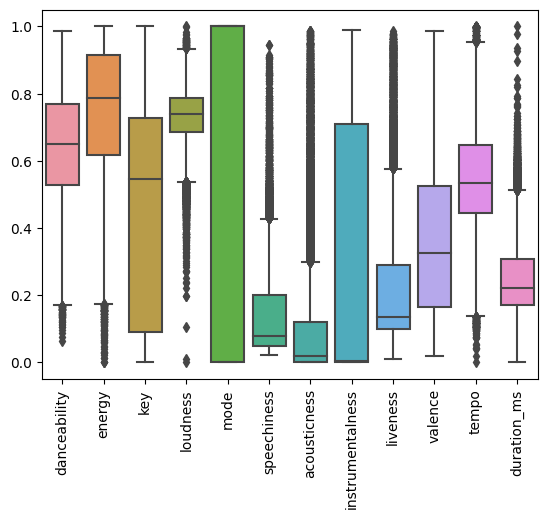

In [10]:
sns.boxplot(data=df)
plt.xticks(rotation=90)

In [11]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

danceability        0.239000
energy              0.296000
key                 0.636364
loudness            0.099110
mode                1.000000
speechiness         0.151800
acousticness        0.119040
instrumentalness    0.711000
liveness            0.191100
valence             0.361000
tempo               0.204050
duration_ms         0.137327
dtype: float64


In [12]:
df = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]
df.shape

C:\Users\artyo\AppData\Local\Temp\ipykernel_3976\4147643536.py:1: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  df = df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]


(28997, 13)

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
danceability,1.000000,-0.386779,-0.017290,-0.238635,0.086944,0.249667,0.188482,-0.087377,-0.210743,0.368950,-0.158097,-0.057805
energy,-0.386779,1.000000,0.050164,0.524286,-0.043924,-0.180057,-0.362939,0.307288,0.189687,-0.017085,-0.027120,0.286647
key,-0.017290,0.050164,1.000000,-0.011822,-0.259430,-0.027445,-0.002289,0.069179,-0.011297,0.033250,-0.016149,0.071001
loudness,-0.238635,0.524286,-0.011822,1.000000,-0.003846,0.065968,-0.114029,-0.223235,0.160217,0.086180,0.188207,-0.134392
mode,0.086944,-0.043924,-0.259430,-0.003846,1.000000,0.052635,-0.010816,-0.026712,-0.002942,0.026061,-0.004451,-0.049575
speechiness,0.249667,-0.180057,-0.027445,0.065968,0.052635,1.000000,0.242177,-0.389709,0.056495,0.252472,0.201711,-0.307412
acousticness,0.188482,-0.362939,-0.002289,-0.114029,-0.010816,0.242177,1.000000,-0.319422,-0.051328,0.163770,0.078484,-0.271110
instrumentalness,-0.087377,0.307288,0.069179,-0.223235,-0.026712,-0.389709,-0.319422,1.000000,-0.078514,-0.259871,-0.218812,0.597296
liveness,-0.210743,0.189687,-0.011297,0.160217,-0.002942,0.056495,-0.051328,-0.078514,1.000000,-0.026519,0.039821,-0.085698
valence,0.368950,-0.017085,0.033250,0.086180,0.026061,0.252472,0.163770,-0.259871,-0.026519,1.000000,0.078867,-0.176574


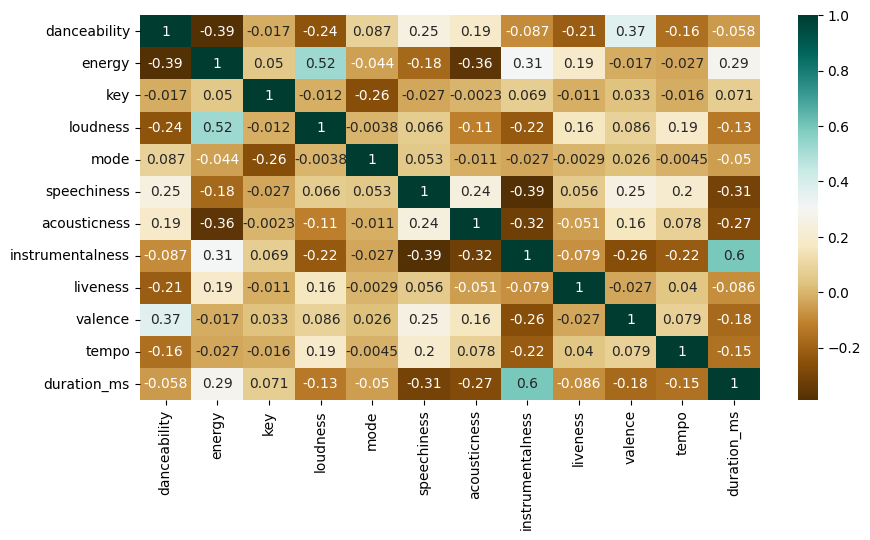

In [13]:
plt.figure(figsize=(10,5))
c= df.corr()
sns.heatmap(c,cmap="BrBG",annot=True)
c

In [14]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
import sklearn as sk
import numpy as np



Text(0.5, 1.0, 'Hisogram plot')

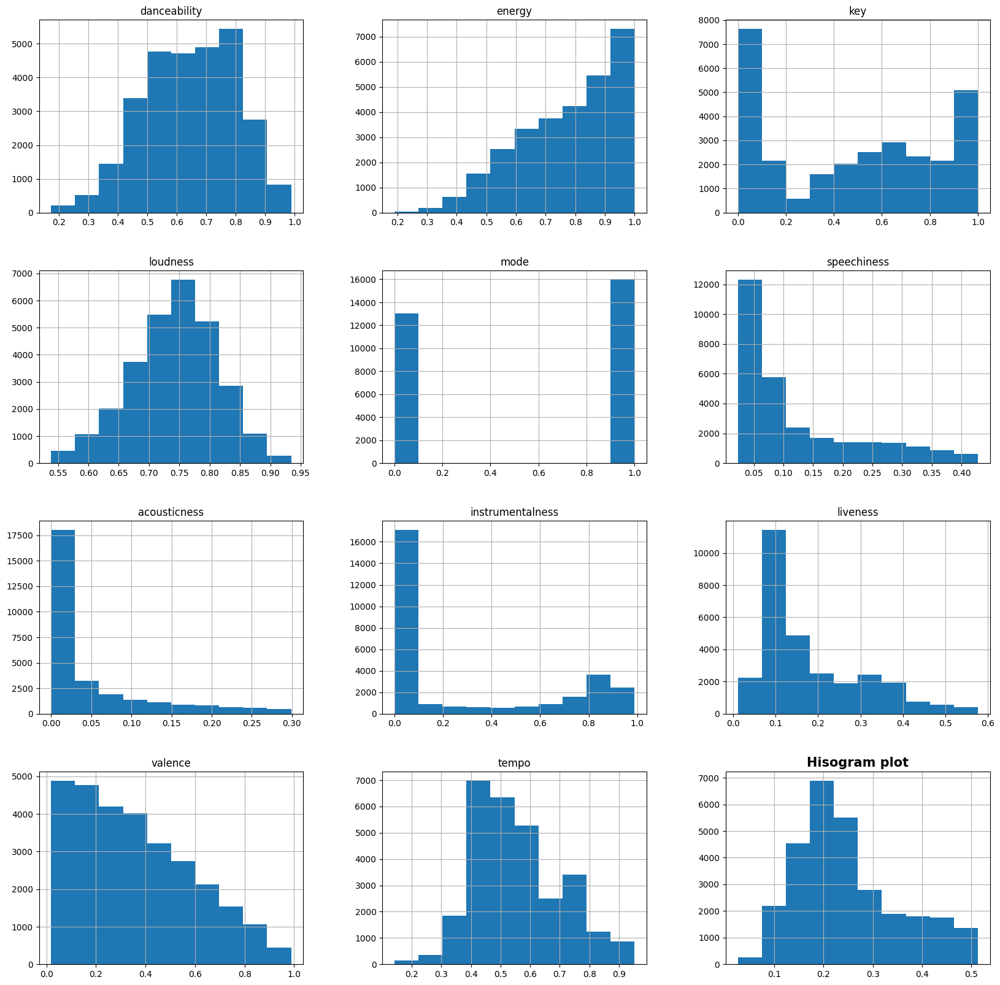

In [15]:
df.hist(figsize=(20,20))
plt.title("Hisogram plot", size=15, weight='bold')

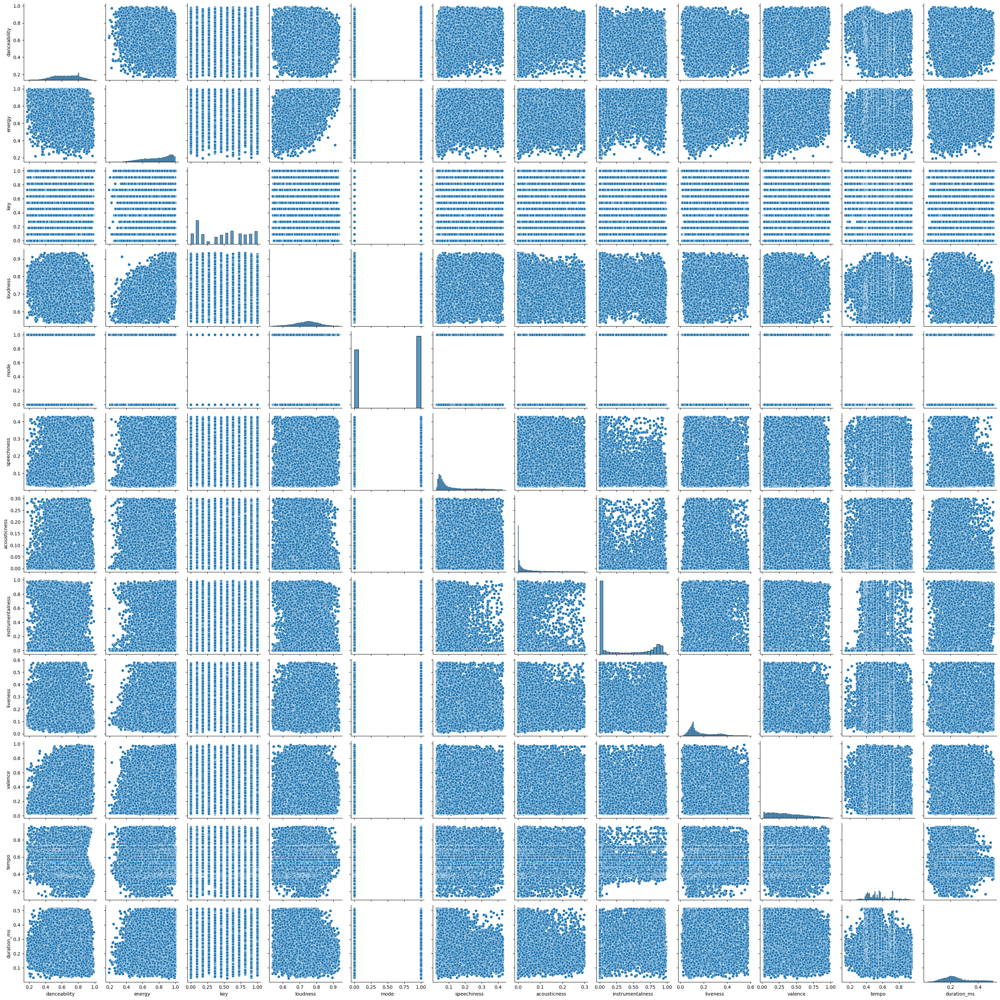

In [16]:
# plot_number = 0 
# for feature_name in df.columns:
#     plot_number += 1
#     plt.subplot(4,4,plot_number)
#     plt.hist(df[feature_name])
sns.pairplot(df)

## Разбиение данных

In [17]:
from sklearn.metrics import classification_report, confusion_matrix
# Y = df["genre"]
# Y = df["genre"].map(
#       {'Dark Trap':0,'Emo':1,'Hiphop':2,'Pop':3,'Rap':4,'RnB':5,'Trap Metal': 6,'Underground Rap':4,
#       'dnb':7,'hardstyle':8,'psytrance':9,'techhouse':10,'techno':10,'trance':9,'trap':0 }).astype(int)
Y = df["genre"].map(
{'Dark Trap':0,'Emo':1,'Hiphop':2,'Pop':3,'Rap':4,'RnB':5,'Trap Metal': 6,'Underground Rap':7,
'dnb':8,'hardstyle':9,'psytrance':10,'techhouse':11,'techno':12,'trance':13,'trap':14 }).astype(int)
print(Y)
X = df[df.columns[[0,1,2,3,4,5,6,7,8,9,10,11]]]
print(X)
X_train, X_test, y_train, y_test = train_test_split(
     X, Y, test_size=0.33, random_state=42, stratify=Y,shuffle=True)


    

0        0
3        0
4        0
5        0
6        0
        ..
42298    9
42300    9
42302    9
42303    9
42304    9
Name: genre, Length: 28997, dtype: int32
       danceability  energy       key  loudness  mode  speechiness  \
0             0.831   0.814  0.181818  0.712039     1       0.4200   
3             0.476   0.781  0.000000  0.784742     1       0.1030   
4             0.798   0.624  0.181818  0.703712     1       0.2930   
5             0.721   0.568  0.000000  0.604356     1       0.4140   
6             0.718   0.668  0.727273  0.799753     1       0.1370   
...             ...     ...       ...       ...   ...          ...   
42298         0.502   0.991  0.454545  0.795069     0       0.2400   
42300         0.528   0.693  0.363636  0.772743     1       0.0304   
42302         0.361   0.821  0.727273  0.828791     1       0.0505   
42303         0.477   0.921  0.545455  0.782906     0       0.0392   
42304         0.529   0.945  0.818182  0.753184     1       0.0615  

##  Иерархическая кластеризация

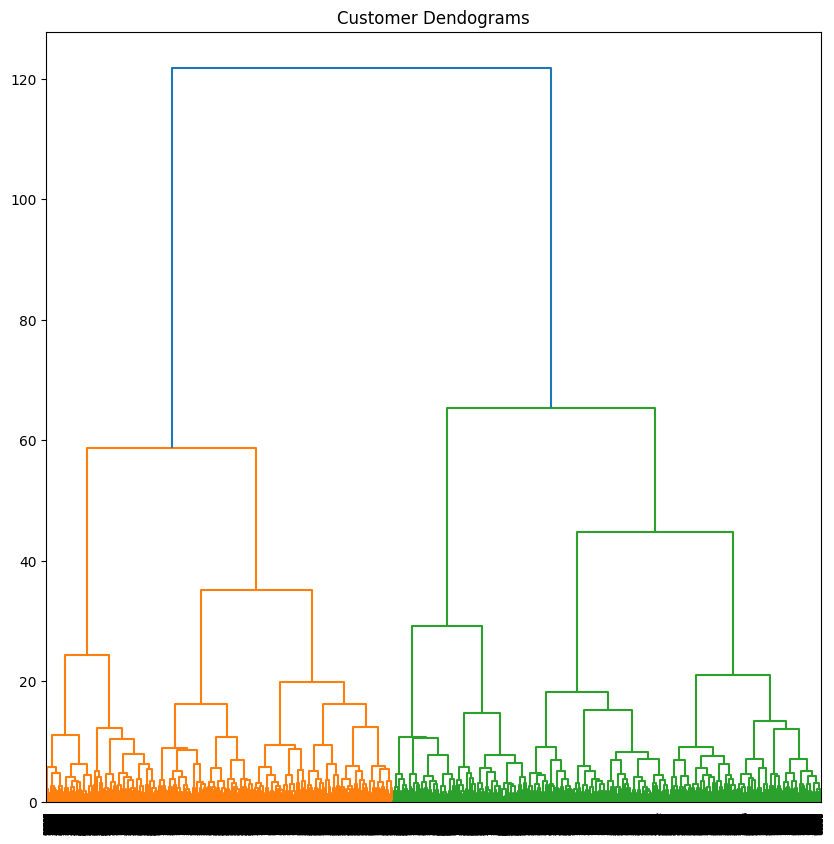

In [18]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(10, 10))
plt.title("Customer Dendograms")
dend = shc.dendrogram(shc.linkage(X, method='ward'))


In [19]:
from sklearn.cluster import AgglomerativeClustering

cluster = AgglomerativeClustering(n_clusters=15, affinity='euclidean', linkage='ward')
cluster.fit_predict(X)
print(cluster)

AgglomerativeClustering(n_clusters=15)


## Original clusters

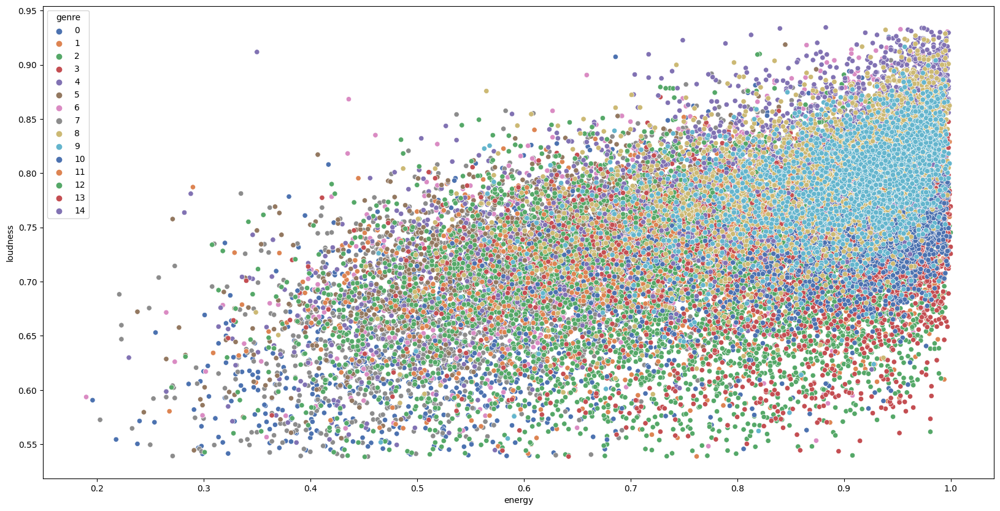

In [20]:
plt.figure(figsize=(20,10))
sns.scatterplot(x = 'energy',y = 'loudness', data = X, hue = Y ,palette='deep')
plt.show()

## AgglomerativeClustering

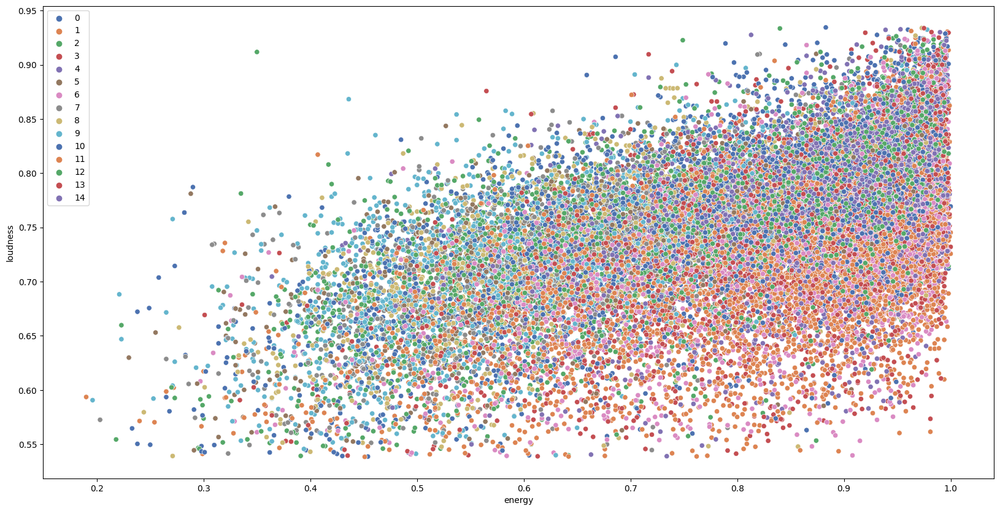

In [21]:
plt.figure(figsize=(20,10))
sns.scatterplot(x = 'energy',y = 'loudness', data = X, hue = cluster.labels_ ,palette='deep')
plt.show()

In [22]:
from sklearn import metrics
metrics.rand_score(Y, cluster.labels_)
# metrics.adjusted_mutual_info_score(Y, cluster.labels_)

0.8691851036216575

## KMeans

In [23]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=15)
kmeans.fit(X)
print(kmeans)

KMeans(n_clusters=15)


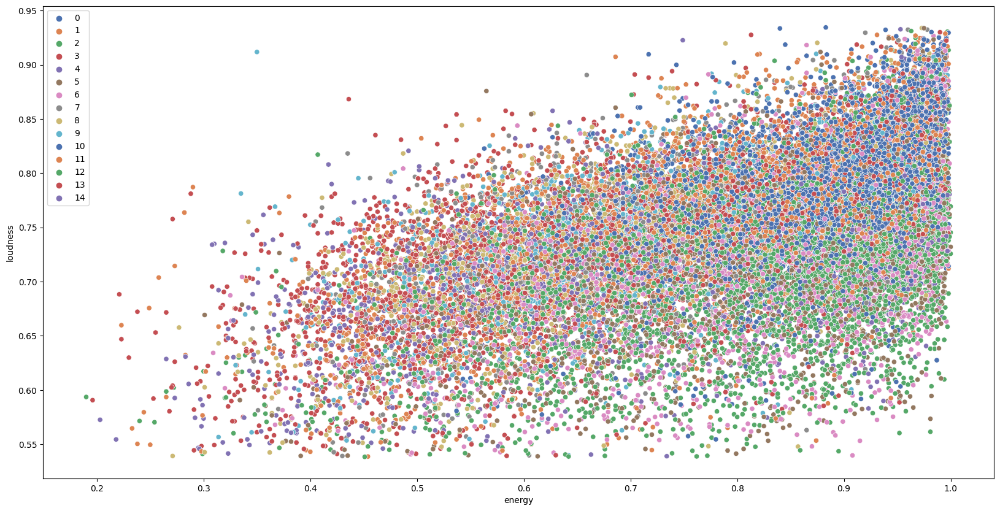

In [24]:
plt.figure(figsize=(20,10))
sns.scatterplot(x = 'energy',y = 'loudness', data = X, hue = kmeans.labels_ ,palette='deep')
plt.show()

In [25]:
metrics.rand_score(Y, kmeans.labels_)

0.8713213029353629

## PCA

In [26]:
from sklearn.decomposition import PCA
pca = PCA(n_components=0.95, svd_solver = 'full')
X_r = pca.fit(X).transform(X)
print(X_r)
print(pca)

[[-0.54832777 -0.29700934 -0.12817635 ...  0.0600905   0.03516732
  -0.0865302 ]
 [-0.58013868 -0.23814978 -0.34976552 ... -0.1129746   0.19350216
  -0.10578119]
 [-0.55560211 -0.37449198 -0.10332995 ...  0.12023177  0.0311425
   0.0554922 ]
 ...
 [-0.36584832 -0.11583792  0.3248896  ... -0.20561627 -0.02761556
   0.11042899]
 [ 0.5340487  -0.26245032 -0.06650014 ... -0.21794646 -0.0488497
  -0.21098326]
 [-0.34458666 -0.11507121  0.41958684 ... -0.20420229 -0.07843744
   0.13050535]]
PCA(n_components=0.95, svd_solver='full')


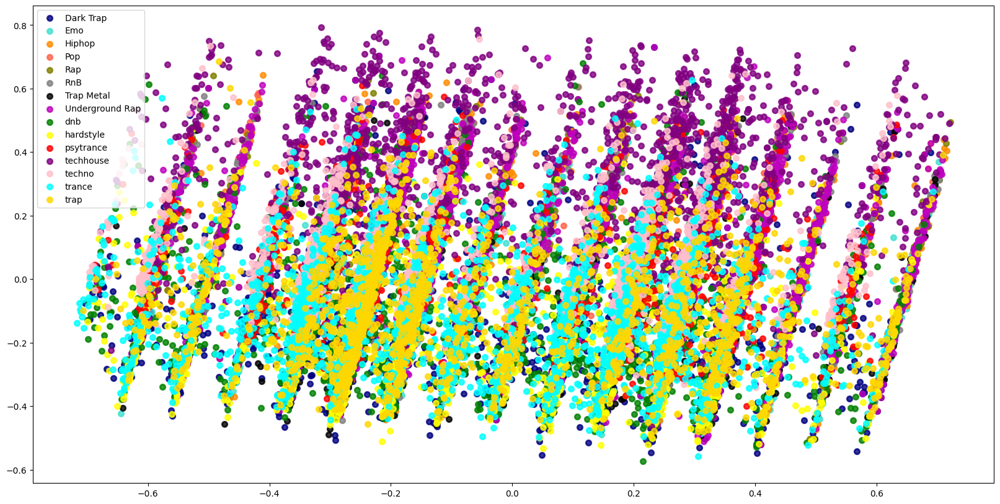

In [32]:
plt.figure(figsize=(20,10))
colors = ['navy', 'turquoise', 'darkorange','tomato','olive','gray','black','m','g','yellow','r','purple','pink','cyan','gold']
targets = ['Dark Trap','Emo','Hiphop','Pop','Rap','RnB','Trap Metal','Underground Rap',
'dnb','hardstyle','psytrance','techhouse','techno','trance','trap']
lw = 2

for color, i, target_name in zip(colors, [0, 1, 2,3,4,5,6,7,8,9,10,11,12,13,14], targets):
    plt.scatter(
        X_r[Y == i, 2], X_r[Y == i, 3], color=color, alpha=0.8, lw=lw, label=target_name
)# or 0,2
plt.legend(loc="best", shadow=False, scatterpoints=1)

## DBSCAN

In [28]:
from sklearn.cluster import DBSCAN

db = DBSCAN(eps=0.2, min_samples=15)
db.fit(X)
print(db)

DBSCAN(eps=0.2, min_samples=15)


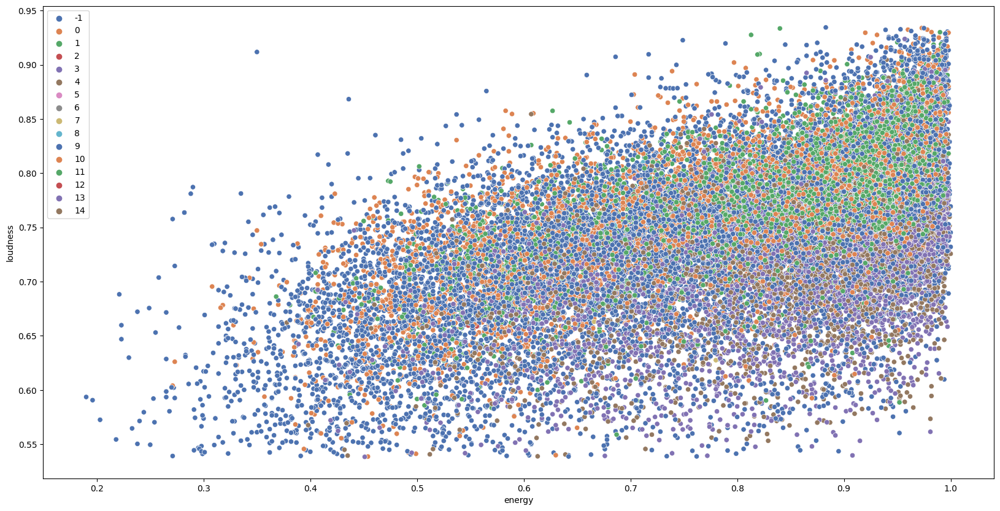

In [29]:
plt.figure(figsize=(20,10))
sns.scatterplot(x = 'energy',y = 'loudness', data = X, hue = db.labels_ ,palette='deep')
plt.show()

In [30]:
metrics.rand_score(Y, db.labels_)

0.6983925318707008